## DM DRP Analysis Sprint, Feb. 2020

### Q: What do the subtracted backgrounds look like in gri?

In particular, this is referring to the backgrounds that have been subtracted from deepCoadds (known as deepCoadd_calexp_background).

To check this, make images of the backgrounds, which were created via spline interpolation of 128x128 regions.

In [146]:
import lsst.daf.persistence as dafPersist
import lsst.geom as geom
import lsst.afw.image as afwImage
import lsst.pipe.base as pipeBase

In [112]:
import os
import glob
import numpy as np
import pandas as pd
import random
from scipy import mgrid
from skimage.filters import gaussian

# img_scale is local:
import img_scale

from astropy.visualization import (MinMaxInterval, AsinhStretch, ZScaleInterval, LogStretch, LinearStretch,
                                   ImageNormalize)

In [21]:
# Set some plotting defaults
%matplotlib inline
import matplotlib.pyplot as plt
zscale = ZScaleInterval()

plt.rcParams.update({'figure.figsize' : (12, 8)})
plt.rcParams.update({'font.size' : 12})
plt.rcParams.update({'axes.linewidth' : 3})
plt.rcParams.update({'axes.labelweight' : 3})
plt.rcParams.update({'axes.titleweight' : 3})
plt.rcParams.update({'ytick.major.width' : 3})
plt.rcParams.update({'ytick.minor.width' : 2})
plt.rcParams.update({'ytick.major.size' : 8})
plt.rcParams.update({'ytick.minor.size' : 5})
plt.rcParams.update({'xtick.major.size' : 8})
plt.rcParams.update({'xtick.minor.size' : 5})
plt.rcParams.update({'xtick.major.width' : 3})
plt.rcParams.update({'xtick.minor.width' : 2})
plt.rcParams.update({'xtick.direction' : 'in'})
plt.rcParams.update({'ytick.direction' : 'in'})

In [22]:
# The output repo is tagged with the Jira ticket number "DM-22223":
rc2_repo = '/datasets/hsc/repo/rerun/RC/w_2020_03/DM-23121'

In [23]:
# Initialize the butler repo:
butler = dafPersist.Butler(rc2_repo)

# Make a glob of the files in the repo, so we can parse this to get tract/patch IDs:
#infiles = glob.glob(rc2_repo+'/deepCoadd/HSC-*/*/*/warp-*.fits') # for tract/patch/visit
infiles = glob.glob(rc2_repo+'/deepCoadd-results/HSC-*/9697/*/calexp-*.fits') # for tract/patch/filter
print(len(infiles))

405


#### Make arrays of the tract, patch numbers by parsing the filenames

In [24]:
tract_array = []
patch_array = []
#visit_array = []
filter_array = []

# Each line of "infiles" looks like this (infile[0]):
##### '/datasets/hsc/repo/rerun/RC/w_2019_46/DM-22223/deepCoadd/HSC-R/9615/8,8/warp-HSC-R-9615-8,8-23902.fits'
# '/datasets/hsc/repo/rerun/RC/w_2020_03/DM-23121/deepCoadd-results/HSC-G/9697/3,2/calexp-HSC-G-9697-3,2.fits'

# Split on the '/', then parse the resulting array. Here's the result of infiles[0].split('/'):

#['',
# 'datasets',
# 'hsc',
# 'repo',
# 'rerun',
# 'RC',
# 'w_2019_46',
# 'DM-22223',
# 'deepCoadd',
# 'HSC-R',
# '9615',
# '8,8',
# 'warp-HSC-R-9615-8,8-23902.fits']

# So the tract number is third from the end, and patch is second from the end.

for ii in range(0, len(infiles)):
    parts = infiles[ii].split('/')
    tract_array.append(int(parts[-3]))
    patch_array.append(parts[-2])
    filter_array.append(parts[-4])
#    # Split the file name to extract the visit number:
#    file_str = parts[-1]
#    file_str2 = file_str.split('.fits')
#    file_str3 = file_str2[0].split('-')
#    visit_array.append(file_str3[-1])

print('Found %i patches'%(len(patch_array)))
        
# Assemble in pandas data frame    
data = {'tract': tract_array,
        'patch': patch_array,
#        'visit': visit_array,
        'filt': filter_array}
df_tract_patch_visit = pd.DataFrame(data=data)

Found 405 patches


Work with tract 9697, which has significant Galactic cirrus.

In [25]:
#df_tract9697 = df_tract_patch_visit.loc[df_tract_patch_visit['tract'] == 9697]

# Patch 2,3 has lots of cirrus:
df_tract9697 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '2,3')]

In [26]:
np.size(df_tract9697)

15

In [27]:
df_tract9697

,tract,patch,filt
48,9697,"2,3",HSC-Y
129,9697,"2,3",HSC-R
210,9697,"2,3",HSC-Z
291,9697,"2,3",HSC-I
372,9697,"2,3",HSC-G


In [28]:
#dataref = {'tract':int(df_tract9697.tract[393]), 'patch':df_tract9697.patch[393], 'filter':df_tract9697.filt[393]}
#calexp_bg = butler.get('deepCoadd_calexp_background', dataId = dataref)

In [29]:
### Randomly select a tract/patch in g-band filter:
df_g = df_tract9697.loc[df_tract9697['filt'] == 'HSC-G'].sample(n=1)
df_r = df_tract9697[(df_tract9697['filt'] == 'HSC-R') & (df_tract9697['tract'] == int(df_g.tract.values[0])) & (df_tract9697['patch'] == str(df_g.patch.values[0]))]
df_i = df_tract9697[(df_tract9697['filt'] == 'HSC-I') & (df_tract9697['tract'] == int(df_g.tract.values[0])) & (df_tract9697['patch'] == str(df_g.patch.values[0]))]

In [30]:
dataref_g = {'tract':int(df_g.tract.values[0]), 'patch':df_g.patch.values[0], 'filter':df_g.filt.values[0]}
bg_img_g = butler.get('deepCoadd_calexp_background', dataId = dataref_g).getImage().array
#img_g = butler.get('deepCoadd_calexp', dataId = dataref_g).getImage().array
img_g = butler.get('deepCoadd', dataId = dataref_g).getImage().array
dataref_r = {'tract':int(df_r.tract.values[0]), 'patch':df_r.patch.values[0], 'filter':df_r.filt.values[0]}
bg_img_r = butler.get('deepCoadd_calexp_background', dataId = dataref_r).getImage().array
img_r = butler.get('deepCoadd', dataId = dataref_r).getImage().array
#img_r = butler.get('deepCoadd_calexp', dataId = dataref_r).getImage().array
dataref_i = {'tract':int(df_i.tract.values[0]), 'patch':df_i.patch.values[0], 'filter':df_i.filt.values[0]}
bg_img_i = butler.get('deepCoadd_calexp_background', dataId = dataref_i).getImage().array
img_i = butler.get('deepCoadd', dataId = dataref_i).getImage().array
calexp_i = butler.get('deepCoadd', dataId = dataref_i)
#img_i = butler.get('deepCoadd_calexp', dataId = dataref_i).getImage().array
#img_g=calexp_g.getImage().array
#img_r=calexp_r.getImage().array
#img_i=calexp_i.getImage().array
#bg_img_g=calexp_bg_g.getImage().array
#bg_img_r=calexp_bg_r.getImage().array
#bg_img_i=calexp_bg_i.getImage().array

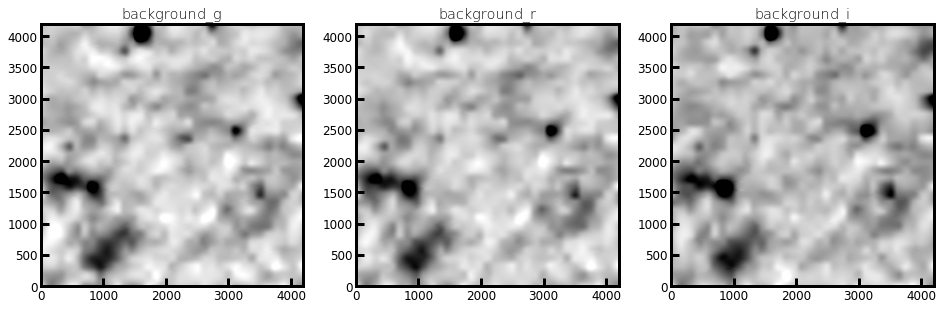

In [31]:
# Set up some plotting defaults:
plt.rcParams.update({'figure.figsize' : (16, 12)})
plt.rcParams.update({'font.size' : 12})

#ncols = 3
f, ax = plt.subplots(1, 3)
#axnum = 0
axs = ax.flatten()

# Create an ImageNormalize object
norm_g = ImageNormalize(bg_img_g, interval=ZScaleInterval(),
                        stretch=LinearStretch())
norm_r = ImageNormalize(bg_img_r, interval=ZScaleInterval(),
                        stretch=LinearStretch())
norm_i = ImageNormalize(bg_img_i, interval=ZScaleInterval(),
                        stretch=LinearStretch())

im0 = axs[0].imshow(bg_img_g, norm=norm_g, origin='lower', cmap='binary')
axs[0].set_title('background_g')
#    plt.colorbar(im0, ax=axs[0])
#    axnum += 1
im1 = axs[1].imshow(bg_img_r, norm=norm_r, origin='lower', cmap='binary')
axs[1].set_title('background_r')
#    plt.colorbar(im1, ax=axs[1])
#    axnum += 1
im2 = axs[2].imshow(bg_img_i, norm=norm_i, origin='lower', cmap='binary')
axs[2].set_title('background_i')
#    plt.colorbar(im2, ax=axs[2])
#    axnum += 1

plt.show()

In [32]:
# RGB image of the background:
bg_img_gri = np.zeros((bg_img_i.shape[0], bg_img_i.shape[1], 3), dtype=float)
bg_iscale = img_scale.range_from_zscale(bg_img_i)
bg_gscale = img_scale.range_from_zscale(bg_img_g)
bg_rscale = img_scale.range_from_zscale(bg_img_r)

/home/jcarlin/DM_sprint_Feb2020/img_scale.py:149: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:167: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:190: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and sile

In [33]:
#img[:,:,0] = img_scale.linear(i, scale_min=-0.01, scale_max=3.0*iscale[1])
#img[:,:,1] = img_scale.linear(r, scale_min=-0.01, scale_max=3.0*rscale[1])
#img[:,:,2] = img_scale.linear(g, scale_min=-0.01, scale_max=3.0*gscale[1])
bg_img_gri[:,:,0] = img_scale.linear(bg_img_i, scale_min=bg_iscale[0], scale_max=3.0*bg_iscale[1])
bg_img_gri[:,:,1] = img_scale.linear(bg_img_r, scale_min=bg_rscale[0], scale_max=3.0*bg_rscale[1])
bg_img_gri[:,:,2] = img_scale.linear(bg_img_g, scale_min=bg_gscale[0], scale_max=3.0*bg_gscale[1])

In [34]:
# RGB image of the deepCoadd calexp:
img_gri = np.zeros((img_i.shape[0], img_i.shape[1], 3), dtype=float)
iscale = img_scale.range_from_zscale(img_i)
gscale = img_scale.range_from_zscale(img_g)
rscale = img_scale.range_from_zscale(img_r)

In [35]:
#img_gri[:,:,0] = img_scale.linear(img_i, scale_min=-0.01, scale_max=3.0*iscale[1])
#img_gri[:,:,1] = img_scale.linear(img_r, scale_min=-0.01, scale_max=3.0*rscale[1])
#img_gri[:,:,2] = img_scale.linear(img_g, scale_min=-0.01, scale_max=3.0*gscale[1])
img_gri[:,:,0] = img_scale.linear(img_i, scale_min=iscale[0], scale_max=3.0*iscale[1])
img_gri[:,:,1] = img_scale.linear(img_r, scale_min=rscale[0], scale_max=3.0*rscale[1])
img_gri[:,:,2] = img_scale.linear(img_g, scale_min=gscale[0], scale_max=3.0*gscale[1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


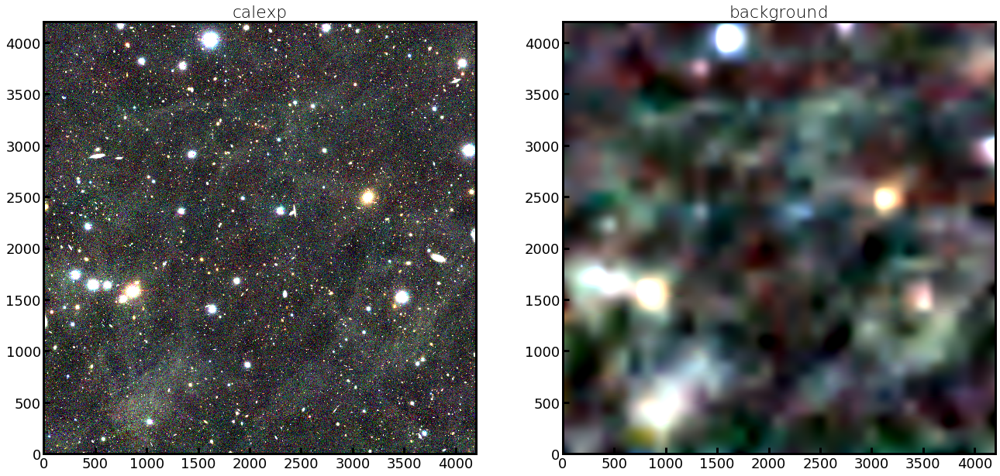

In [36]:
norm_gri = ImageNormalize(img_gri, interval=ZScaleInterval(),
                          stretch=LinearStretch())
norm_bg_gri = ImageNormalize(bg_img_gri, interval=ZScaleInterval(),
                             stretch=LinearStretch())

plt.rcParams.update({'figure.figsize' : (22, 12)})
plt.rcParams.update({'font.size' : 18})

f, ax = plt.subplots(1, 2)
axs = ax.flatten()

im0 = axs[0].imshow(img_gri, norm=norm_gri, origin='lower')
axs[0].set_title('calexp')
im1 = axs[1].imshow(bg_img_gri, norm=norm_bg_gri, origin='lower')
axs[1].set_title('background')
plt.show()

### Now try mosaicking multiple patches together
Remember to cut off the 100-pixel overlaps!

In [37]:
# Start near patch 2,3, which has lots of cirrus:
df_tract9697_patch23 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '2,3')]
df_tract9697_patch24 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '2,4')]
df_tract9697_patch33 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '3,3')]
df_tract9697_patch34 = df_tract_patch_visit.loc[(df_tract_patch_visit['tract'] == 9697) & (df_tract_patch_visit['patch'] == '3,4')]


In [38]:
df_tract9697_patch23

,tract,patch,filt
48,9697,"2,3",HSC-Y
129,9697,"2,3",HSC-R
210,9697,"2,3",HSC-Z
291,9697,"2,3",HSC-I
372,9697,"2,3",HSC-G


In [39]:
### Select the tract/patch in g-band filter, then the same tract/patch in R, I:
df_g23 = df_tract9697_patch23[(df_tract9697_patch23['filt'] == 'HSC-G')]
df_r23 = df_tract9697_patch23[(df_tract9697_patch23['filt'] == 'HSC-R') & (df_tract9697_patch23['tract'] == int(df_g23.tract.values[0])) & (df_tract9697_patch23['patch'] == str(df_g23.patch.values[0]))]
df_i23 = df_tract9697_patch23[(df_tract9697_patch23['filt'] == 'HSC-I') & (df_tract9697_patch23['tract'] == int(df_g23.tract.values[0])) & (df_tract9697_patch23['patch'] == str(df_g23.patch.values[0]))]

df_g24 = df_tract9697_patch24[(df_tract9697_patch24['filt'] == 'HSC-G')]
df_r24 = df_tract9697_patch24[(df_tract9697_patch24['filt'] == 'HSC-R') & (df_tract9697_patch24['tract'] == int(df_g24.tract.values[0])) & (df_tract9697_patch24['patch'] == str(df_g24.patch.values[0]))]
df_i24 = df_tract9697_patch24[(df_tract9697_patch24['filt'] == 'HSC-I') & (df_tract9697_patch24['tract'] == int(df_g24.tract.values[0])) & (df_tract9697_patch24['patch'] == str(df_g24.patch.values[0]))]

df_g33 = df_tract9697_patch33[(df_tract9697_patch33['filt'] == 'HSC-G')]
df_r33 = df_tract9697_patch33[(df_tract9697_patch33['filt'] == 'HSC-R') & (df_tract9697_patch33['tract'] == int(df_g33.tract.values[0])) & (df_tract9697_patch33['patch'] == str(df_g33.patch.values[0]))]
df_i33 = df_tract9697_patch33[(df_tract9697_patch33['filt'] == 'HSC-I') & (df_tract9697_patch33['tract'] == int(df_g33.tract.values[0])) & (df_tract9697_patch33['patch'] == str(df_g33.patch.values[0]))]

df_g34 = df_tract9697_patch34[(df_tract9697_patch34['filt'] == 'HSC-G')]
df_r34 = df_tract9697_patch34[(df_tract9697_patch34['filt'] == 'HSC-R') & (df_tract9697_patch34['tract'] == int(df_g34.tract.values[0])) & (df_tract9697_patch34['patch'] == str(df_g34.patch.values[0]))]
df_i34 = df_tract9697_patch34[(df_tract9697_patch34['filt'] == 'HSC-I') & (df_tract9697_patch34['tract'] == int(df_g34.tract.values[0])) & (df_tract9697_patch34['patch'] == str(df_g34.patch.values[0]))]


In [40]:
df_i24

,tract,patch,filt
305,9697,"2,4",HSC-I


In [41]:
dataref_g23 = {'tract':int(df_g23.tract.values[0]), 'patch':df_g23.patch.values[0], 'filter':df_g23.filt.values[0]}
dataref_r23 = {'tract':int(df_r23.tract.values[0]), 'patch':df_r23.patch.values[0], 'filter':df_r23.filt.values[0]}
dataref_i23 = {'tract':int(df_i23.tract.values[0]), 'patch':df_i23.patch.values[0], 'filter':df_i23.filt.values[0]}
dataref_g24 = {'tract':int(df_g24.tract.values[0]), 'patch':df_g24.patch.values[0], 'filter':df_g24.filt.values[0]}
dataref_r24 = {'tract':int(df_r24.tract.values[0]), 'patch':df_r24.patch.values[0], 'filter':df_r24.filt.values[0]}
dataref_i24 = {'tract':int(df_i24.tract.values[0]), 'patch':df_i24.patch.values[0], 'filter':df_i24.filt.values[0]}
dataref_g33 = {'tract':int(df_g33.tract.values[0]), 'patch':df_g33.patch.values[0], 'filter':df_g33.filt.values[0]}
dataref_r33 = {'tract':int(df_r33.tract.values[0]), 'patch':df_r33.patch.values[0], 'filter':df_r33.filt.values[0]}
dataref_i33 = {'tract':int(df_i33.tract.values[0]), 'patch':df_i33.patch.values[0], 'filter':df_i33.filt.values[0]}
dataref_g34 = {'tract':int(df_g34.tract.values[0]), 'patch':df_g34.patch.values[0], 'filter':df_g34.filt.values[0]}
dataref_r34 = {'tract':int(df_r34.tract.values[0]), 'patch':df_r34.patch.values[0], 'filter':df_r34.filt.values[0]}
dataref_i34 = {'tract':int(df_i34.tract.values[0]), 'patch':df_i34.patch.values[0], 'filter':df_i34.filt.values[0]}


In [70]:
dataref_i34

{'tract': 9697, 'patch': '3,4', 'filter': 'HSC-I'}

In [42]:
expWcs23 =  butler.get("deepCoadd_calexp", dataId=dataref_g23).getWcs()
expWcs24 =  butler.get("deepCoadd_calexp", dataId=dataref_g24).getWcs()
expWcs33 =  butler.get("deepCoadd_calexp", dataId=dataref_g33).getWcs()
bbox23 = butler.get('deepCoadd', dataId = dataref_g23).getBBox()
bbox24 = butler.get('deepCoadd', dataId = dataref_g24).getBBox()
bbox33 = butler.get('deepCoadd', dataId = dataref_g33).getBBox()
skyCorners23 = [expWcs23.pixelToSky(geom.Point2D(pixPos)) for pixPos in bbox23.getCorners()]
skyCorners24 = [expWcs24.pixelToSky(geom.Point2D(pixPos)) for pixPos in bbox24.getCorners()]
skyCorners33 = [expWcs33.pixelToSky(geom.Point2D(pixPos)) for pixPos in bbox33.getCorners()]
print(skyCorners23)
print(skyCorners24)
print(skyCorners33)

[SpherePoint(338.2490631358099*geom.degrees, 0.4591684609032858*geom.degrees), SpherePoint(338.05311443680574*geom.degrees, 0.4591786922494381*geom.degrees), SpherePoint(338.0531266614873*geom.degrees, 0.6551274924485044*geom.degrees), SpherePoint(338.24908405980256*geom.degrees, 0.6551128943536408*geom.degrees)]
[SpherePoint(338.24908306812586*geom.degrees, 0.6458265665350201*geom.degrees), SpherePoint(338.0531260821078*geom.degrees, 0.6458409576743489*geom.degrees), SpherePoint(338.0531383078234*geom.degrees, 0.8417918371398867*geom.degrees), SpherePoint(338.24910399388847*geom.degrees, 0.8417730791128029*geom.degrees)]
[SpherePoint(338.06240106535626*geom.degrees, 0.459178328580522*geom.degrees), SpherePoint(337.8664461271913*geom.degrees, 0.4591834441781514*geom.degrees), SpherePoint(337.86645006403467*geom.degrees, 0.6551342725051212*geom.degrees), SpherePoint(338.06241370234176*geom.degrees, 0.655126973565318*geom.degrees)]


In [43]:
img_g23 = butler.get('deepCoadd', dataId = dataref_g23).getImage().array
img_g24 = butler.get('deepCoadd', dataId = dataref_g24).getImage().array
img_g33 = butler.get('deepCoadd', dataId = dataref_g33).getImage().array
img_g34 = butler.get('deepCoadd', dataId = dataref_g34).getImage().array
bg_img_g23 = butler.get('deepCoadd_calexp_background', dataId = dataref_g23).getImage().array
bg_img_g24 = butler.get('deepCoadd_calexp_background', dataId = dataref_g24).getImage().array
bg_img_g33 = butler.get('deepCoadd_calexp_background', dataId = dataref_g33).getImage().array
bg_img_g34 = butler.get('deepCoadd_calexp_background', dataId = dataref_g34).getImage().array
img_r23 = butler.get('deepCoadd', dataId = dataref_r23).getImage().array
img_r24 = butler.get('deepCoadd', dataId = dataref_r24).getImage().array
img_r33 = butler.get('deepCoadd', dataId = dataref_r33).getImage().array
img_r34 = butler.get('deepCoadd', dataId = dataref_r34).getImage().array
bg_img_r23 = butler.get('deepCoadd_calexp_background', dataId = dataref_r23).getImage().array
bg_img_r24 = butler.get('deepCoadd_calexp_background', dataId = dataref_r24).getImage().array
bg_img_r33 = butler.get('deepCoadd_calexp_background', dataId = dataref_r33).getImage().array
bg_img_r34 = butler.get('deepCoadd_calexp_background', dataId = dataref_r34).getImage().array
img_i23 = butler.get('deepCoadd', dataId = dataref_i23).getImage().array
img_i24 = butler.get('deepCoadd', dataId = dataref_i24).getImage().array
img_i33 = butler.get('deepCoadd', dataId = dataref_i33).getImage().array
img_i34 = butler.get('deepCoadd', dataId = dataref_i34).getImage().array
bg_img_i23 = butler.get('deepCoadd_calexp_background', dataId = dataref_i23).getImage().array
bg_img_i24 = butler.get('deepCoadd_calexp_background', dataId = dataref_i24).getImage().array
bg_img_i33 = butler.get('deepCoadd_calexp_background', dataId = dataref_i33).getImage().array
bg_img_i34 = butler.get('deepCoadd_calexp_background', dataId = dataref_i34).getImage().array


In [44]:
def rebin( a, newshape ):
        '''Rebin an array to a new shape.
        '''
        assert len(a.shape) == len(newshape)

        slices = [ slice(0,old, float(old)/new) for old,new in zip(a.shape,newshape) ]
        coordinates = mgrid[slices]
        indices = coordinates.astype('i')   #choose the biggest smaller integer index
        return a[tuple(indices)]

In [119]:
smth_scale = 5

# g-band
bg_img_g23_trim = bg_img_g23[:-100,:-100]
bg_img_g24_trim = bg_img_g24[100:,:-100]
bg_img_g33_trim = bg_img_g33[:-100,100:]
bg_img_g34_trim = bg_img_g34[100:,100:]
#bg_img_g34_trim = bg_img_g34[:-100,100:]
bg_img_g23_trim_rebin = rebin(bg_img_g23_trim, (np.shape(bg_img_g23_trim)[0]/2,np.shape(bg_img_g23_trim)[1]/2)) # Cut down by half
bg_img_g24_trim_rebin = rebin(bg_img_g24_trim, (np.shape(bg_img_g24_trim)[0]/2,np.shape(bg_img_g24_trim)[1]/2)) # Cut down by half
bg_img_g33_trim_rebin = rebin(bg_img_g33_trim, (np.shape(bg_img_g33_trim)[0]/2,np.shape(bg_img_g33_trim)[1]/2)) # Cut down by half
bg_img_g34_trim_rebin = rebin(bg_img_g34_trim, (np.shape(bg_img_g34_trim)[0]/2,np.shape(bg_img_g34_trim)[1]/2)) # Cut down by half
img_g23_trim = img_g23[:-100,:-100]
img_g24_trim = img_g24[100:,:-100]
img_g33_trim = img_g33[:-100,100:]
img_g34_trim = img_g34[100:,100:]
#img_g34_trim = img_g34[:-100,100:]
img_g23_trim_rebin = rebin(gaussian(img_g23_trim, sigma=smth_scale), (np.shape(img_g23_trim)[0]/2,np.shape(img_g23_trim)[1]/2)) # Cut down by half
img_g24_trim_rebin = rebin(gaussian(img_g24_trim, sigma=smth_scale), (np.shape(img_g24_trim)[0]/2,np.shape(img_g24_trim)[1]/2)) # Cut down by half
img_g33_trim_rebin = rebin(gaussian(img_g33_trim, sigma=smth_scale), (np.shape(img_g33_trim)[0]/2,np.shape(img_g33_trim)[1]/2)) # Cut down by half
img_g34_trim_rebin = rebin(gaussian(img_g34_trim, sigma=smth_scale), (np.shape(img_g34_trim)[0]/2,np.shape(img_g34_trim)[1]/2)) # Cut down by half
#img_g23_trim_rebin = rebin(img_g23_trim, (np.shape(img_g23_trim)[0]/2,np.shape(img_g23_trim)[1]/2)) # Cut down by half
#img_g24_trim_rebin = rebin(img_g24_trim, (np.shape(img_g24_trim)[0]/2,np.shape(img_g24_trim)[1]/2)) # Cut down by half
#img_g33_trim_rebin = rebin(img_g33_trim, (np.shape(img_g33_trim)[0]/2,np.shape(img_g33_trim)[1]/2)) # Cut down by half
#img_g34_trim_rebin = rebin(img_g34_trim, (np.shape(img_g34_trim)[0]/2,np.shape(img_g34_trim)[1]/2)) # Cut down by half
# r-band
bg_img_r23_trim = bg_img_r23[:-100,:-100]
bg_img_r24_trim = bg_img_r24[100:,:-100]
bg_img_r33_trim = bg_img_r33[:-100,100:]
bg_img_r34_trim = bg_img_r34[100:,100:]
#bg_img_r34_trim = bg_img_r34[:-100,100:]
bg_img_r23_trim_rebin = rebin(bg_img_r23_trim, (np.shape(bg_img_r23_trim)[0]/2,np.shape(bg_img_r23_trim)[1]/2)) # Cut down by half
bg_img_r24_trim_rebin = rebin(bg_img_r24_trim, (np.shape(bg_img_r24_trim)[0]/2,np.shape(bg_img_r24_trim)[1]/2)) # Cut down by half
bg_img_r33_trim_rebin = rebin(bg_img_r33_trim, (np.shape(bg_img_r33_trim)[0]/2,np.shape(bg_img_r33_trim)[1]/2)) # Cut down by half
bg_img_r34_trim_rebin = rebin(bg_img_r34_trim, (np.shape(bg_img_r34_trim)[0]/2,np.shape(bg_img_r34_trim)[1]/2)) # Cut down by half
img_r23_trim = img_r23[:-100,:-100]
img_r24_trim = img_r24[100:,:-100]
img_r33_trim = img_r33[:-100,100:]
img_r34_trim = img_r34[100:,100:]
#img_r34_trim = img_r34[:-100,100:]
img_r23_trim_rebin = rebin(gaussian(img_r23_trim, sigma=smth_scale), (np.shape(img_r23_trim)[0]/2,np.shape(img_r23_trim)[1]/2)) # Cut down by half
img_r24_trim_rebin = rebin(gaussian(img_r24_trim, sigma=smth_scale), (np.shape(img_r24_trim)[0]/2,np.shape(img_r24_trim)[1]/2)) # Cut down by half
img_r33_trim_rebin = rebin(gaussian(img_r33_trim, sigma=smth_scale), (np.shape(img_r33_trim)[0]/2,np.shape(img_r33_trim)[1]/2)) # Cut down by half
img_r34_trim_rebin = rebin(gaussian(img_r34_trim, sigma=smth_scale), (np.shape(img_r34_trim)[0]/2,np.shape(img_r34_trim)[1]/2)) # Cut down by half
#img_r23_trim_rebin = rebin(img_r23_trim, (np.shape(img_r23_trim)[0]/2,np.shape(img_r23_trim)[1]/2)) # Cut down by half
#img_r24_trim_rebin = rebin(img_r24_trim, (np.shape(img_r24_trim)[0]/2,np.shape(img_r24_trim)[1]/2)) # Cut down by half
#img_r33_trim_rebin = rebin(img_r33_trim, (np.shape(img_r33_trim)[0]/2,np.shape(img_r33_trim)[1]/2)) # Cut down by half
#img_r34_trim_rebin = rebin(img_r34_trim, (np.shape(img_r34_trim)[0]/2,np.shape(img_r34_trim)[1]/2)) # Cut down by half
# i-band
bg_img_i23_trim = bg_img_i23[:-100,:-100]
bg_img_i24_trim = bg_img_i24[100:,:-100]
bg_img_i33_trim = bg_img_i33[:-100,100:]
bg_img_i34_trim = bg_img_i34[100:,100:]
#bg_img_i34_trim = bg_img_i34[:-100,100:]
bg_img_i23_trim_rebin = rebin(bg_img_i23_trim, (np.shape(bg_img_i23_trim)[0]/2,np.shape(bg_img_i23_trim)[1]/2)) # Cut down by half
bg_img_i24_trim_rebin = rebin(bg_img_i24_trim, (np.shape(bg_img_i24_trim)[0]/2,np.shape(bg_img_i24_trim)[1]/2)) # Cut down by half
bg_img_i33_trim_rebin = rebin(bg_img_i33_trim, (np.shape(bg_img_i33_trim)[0]/2,np.shape(bg_img_i33_trim)[1]/2)) # Cut down by half
bg_img_i34_trim_rebin = rebin(bg_img_i34_trim, (np.shape(bg_img_i34_trim)[0]/2,np.shape(bg_img_i34_trim)[1]/2)) # Cut down by half
img_i23_trim = img_i23[:-100,:-100]
img_i24_trim = img_i24[100:,:-100]
img_i33_trim = img_i33[:-100,100:]
img_i34_trim = img_i34[100:,100:]
#img_i34_trim = img_i34[:-100,100:]
img_i23_trim_rebin = rebin(gaussian(img_i23_trim, sigma=smth_scale), (np.shape(img_i23_trim)[0]/2,np.shape(img_i23_trim)[1]/2)) # Cut down by half
img_i24_trim_rebin = rebin(gaussian(img_i24_trim, sigma=smth_scale), (np.shape(img_i24_trim)[0]/2,np.shape(img_i24_trim)[1]/2)) # Cut down by half
img_i33_trim_rebin = rebin(gaussian(img_i33_trim, sigma=smth_scale), (np.shape(img_i33_trim)[0]/2,np.shape(img_i33_trim)[1]/2)) # Cut down by half
img_i34_trim_rebin = rebin(gaussian(img_i34_trim, sigma=smth_scale), (np.shape(img_i34_trim)[0]/2,np.shape(img_i34_trim)[1]/2)) # Cut down by half


/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in log10
/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/ipykernel/__main__.py:10: RuntimeWarning: invalid value encountered in log10
/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: invalid value encountered in log10
/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: invalid value encountered in log10


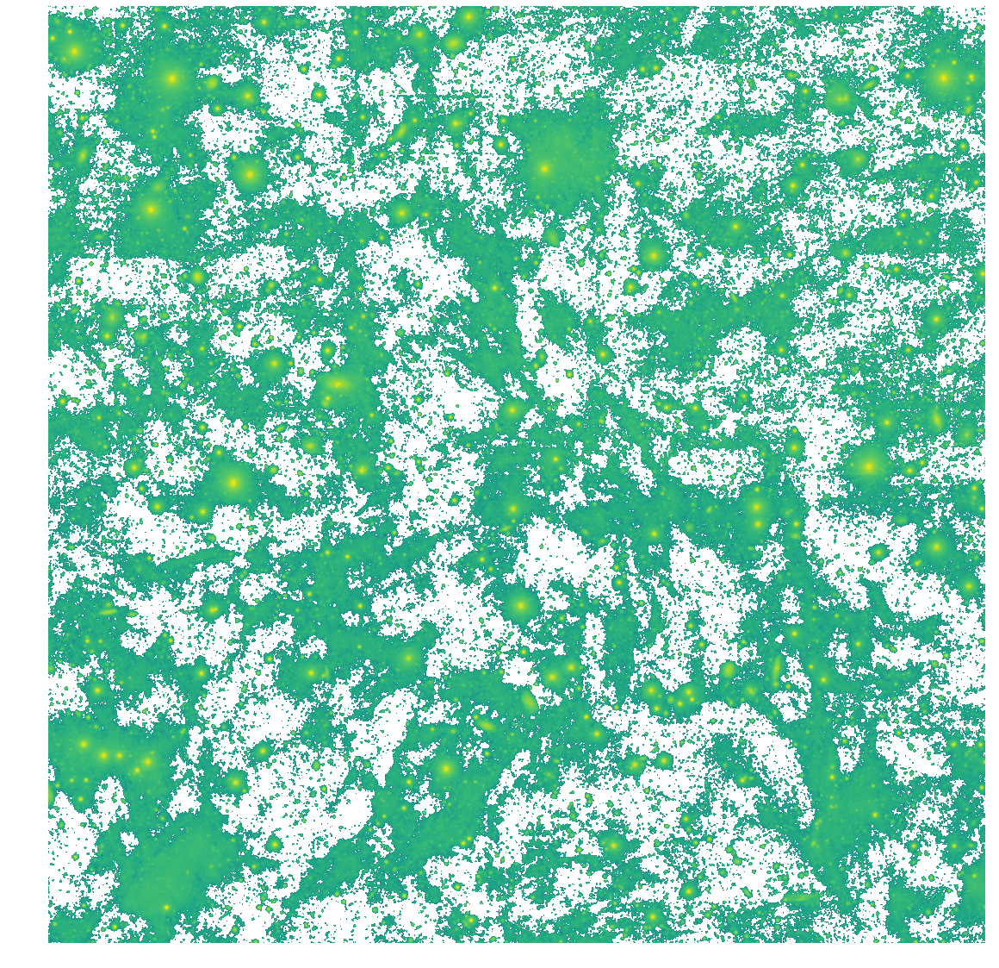

In [145]:
plt.rcParams.update({'figure.figsize' : (19.5, 20)})
fig=plt.figure()
fig.subplots_adjust(wspace=0, hspace=0)

ax1 = plt.subplot(221)
ax1.axis('off')
im1 = ax1.imshow(np.log10(img_g24_trim_rebin), origin='lower')
ax2 = plt.subplot(222, sharey=ax1)
ax2.axis('off')
im2 = ax2.imshow(np.log10(img_g34_trim_rebin), origin='lower')
ax3 = plt.subplot(223, sharex=ax1)
ax3.axis('off')
im3 = ax3.imshow(np.log10(img_g23_trim_rebin), origin='lower')
ax4 = plt.subplot(224, sharex=ax2, sharey=ax3)
ax4.axis('off')
im4 = ax4.imshow(np.log10(img_g33_trim_rebin), origin='lower')

plt.show()

In [120]:
# RGB image of the background:
bg_img_gri23 = np.zeros((bg_img_i23_trim_rebin.shape[0], bg_img_i23_trim_rebin.shape[1], 3), dtype=float)
bg_iscale = img_scale.range_from_zscale(bg_img_i23_trim_rebin)
bg_gscale = img_scale.range_from_zscale(bg_img_g23_trim_rebin)
bg_rscale = img_scale.range_from_zscale(bg_img_r23_trim_rebin)

bg_img_gri23[:,:,0] = img_scale.linear(bg_img_i23_trim_rebin, scale_min=bg_iscale[0], scale_max=3.0*bg_iscale[1])
bg_img_gri23[:,:,1] = img_scale.linear(bg_img_r23_trim_rebin, scale_min=bg_rscale[0], scale_max=3.0*bg_rscale[1])
bg_img_gri23[:,:,2] = img_scale.linear(bg_img_g23_trim_rebin, scale_min=bg_gscale[0], scale_max=3.0*bg_gscale[1])

# RGB image of the coaddd:
img_gri23 = np.zeros((img_i23_trim_rebin.shape[0], img_i23_trim_rebin.shape[1], 3), dtype=float)
iscale = img_scale.range_from_zscale(img_i23_trim_rebin)
gscale = img_scale.range_from_zscale(img_g23_trim_rebin)
rscale = img_scale.range_from_zscale(img_r23_trim_rebin)

img_gri23[:,:,0] = img_scale.linear(img_i23_trim_rebin, scale_min=iscale[0], scale_max=3.0*iscale[1])
img_gri23[:,:,1] = img_scale.linear(img_r23_trim_rebin, scale_min=rscale[0], scale_max=3.0*rscale[1])
img_gri23[:,:,2] = img_scale.linear(img_g23_trim_rebin, scale_min=gscale[0], scale_max=3.0*gscale[1])

In [121]:
# RGB image of the background:
bg_img_gri24 = np.zeros((bg_img_i24_trim_rebin.shape[0], bg_img_i24_trim_rebin.shape[1], 3), dtype=float)
bg_iscale = img_scale.range_from_zscale(bg_img_i24_trim_rebin)
bg_gscale = img_scale.range_from_zscale(bg_img_g24_trim_rebin)
bg_rscale = img_scale.range_from_zscale(bg_img_r24_trim_rebin)

bg_img_gri24[:,:,0] = img_scale.linear(bg_img_i24_trim_rebin, scale_min=bg_iscale[0], scale_max=3.0*bg_iscale[1])
bg_img_gri24[:,:,1] = img_scale.linear(bg_img_r24_trim_rebin, scale_min=bg_rscale[0], scale_max=3.0*bg_rscale[1])
bg_img_gri24[:,:,2] = img_scale.linear(bg_img_g24_trim_rebin, scale_min=bg_gscale[0], scale_max=3.0*bg_gscale[1])

# RGB image of the coaddd:
img_gri24 = np.zeros((img_i24_trim_rebin.shape[0], img_i24_trim_rebin.shape[1], 3), dtype=float)
iscale = img_scale.range_from_zscale(img_i24_trim_rebin)
gscale = img_scale.range_from_zscale(img_g24_trim_rebin)
rscale = img_scale.range_from_zscale(img_r24_trim_rebin)

img_gri24[:,:,0] = img_scale.linear(img_i24_trim_rebin, scale_min=iscale[0], scale_max=3.0*iscale[1])
img_gri24[:,:,1] = img_scale.linear(img_r24_trim_rebin, scale_min=rscale[0], scale_max=3.0*rscale[1])
img_gri24[:,:,2] = img_scale.linear(img_g24_trim_rebin, scale_min=gscale[0], scale_max=3.0*gscale[1])

In [122]:
# RGB image of the background:
bg_img_gri33 = np.zeros((bg_img_i33_trim_rebin.shape[0], bg_img_i33_trim_rebin.shape[1], 3), dtype=float)
bg_iscale = img_scale.range_from_zscale(bg_img_i33_trim_rebin)
bg_gscale = img_scale.range_from_zscale(bg_img_g33_trim_rebin)
bg_rscale = img_scale.range_from_zscale(bg_img_r33_trim_rebin)

bg_img_gri33[:,:,0] = img_scale.linear(bg_img_i33_trim_rebin, scale_min=bg_iscale[0], scale_max=3.0*bg_iscale[1])
bg_img_gri33[:,:,1] = img_scale.linear(bg_img_r33_trim_rebin, scale_min=bg_rscale[0], scale_max=3.0*bg_rscale[1])
bg_img_gri33[:,:,2] = img_scale.linear(bg_img_g33_trim_rebin, scale_min=bg_gscale[0], scale_max=3.0*bg_gscale[1])

# RGB image of the coaddd:
img_gri33 = np.zeros((img_i33_trim_rebin.shape[0], img_i33_trim_rebin.shape[1], 3), dtype=float)
iscale = img_scale.range_from_zscale(img_i33_trim_rebin)
gscale = img_scale.range_from_zscale(img_g33_trim_rebin)
rscale = img_scale.range_from_zscale(img_r33_trim_rebin)

img_gri33[:,:,0] = img_scale.linear(img_i33_trim_rebin, scale_min=iscale[0], scale_max=3.0*iscale[1])
img_gri33[:,:,1] = img_scale.linear(img_r33_trim_rebin, scale_min=rscale[0], scale_max=3.0*rscale[1])
img_gri33[:,:,2] = img_scale.linear(img_g33_trim_rebin, scale_min=gscale[0], scale_max=3.0*gscale[1])

In [123]:
# RGB image of the background:
bg_img_gri34 = np.zeros((bg_img_i34_trim_rebin.shape[0], bg_img_i34_trim_rebin.shape[1], 3), dtype=float)
bg_iscale = img_scale.range_from_zscale(bg_img_i34_trim_rebin)
bg_gscale = img_scale.range_from_zscale(bg_img_g34_trim_rebin)
bg_rscale = img_scale.range_from_zscale(bg_img_r34_trim_rebin)

bg_img_gri34[:,:,0] = img_scale.linear(bg_img_i34_trim_rebin, scale_min=bg_iscale[0], scale_max=3.0*bg_iscale[1])
bg_img_gri34[:,:,1] = img_scale.linear(bg_img_r34_trim_rebin, scale_min=bg_rscale[0], scale_max=3.0*bg_rscale[1])
bg_img_gri34[:,:,2] = img_scale.linear(bg_img_g34_trim_rebin, scale_min=bg_gscale[0], scale_max=3.0*bg_gscale[1])

# RGB image of the coaddd:
img_gri34 = np.zeros((img_i34_trim_rebin.shape[0], img_i34_trim_rebin.shape[1], 3), dtype=float)
iscale = img_scale.range_from_zscale(img_i34_trim_rebin)
gscale = img_scale.range_from_zscale(img_g34_trim_rebin)
rscale = img_scale.range_from_zscale(img_r34_trim_rebin)

img_gri34[:,:,0] = img_scale.linear(img_i34_trim_rebin, scale_min=iscale[0], scale_max=3.0*iscale[1])
img_gri34[:,:,1] = img_scale.linear(img_r34_trim_rebin, scale_min=rscale[0], scale_max=3.0*rscale[1])
img_gri34[:,:,2] = img_scale.linear(img_g34_trim_rebin, scale_min=gscale[0], scale_max=3.0*gscale[1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


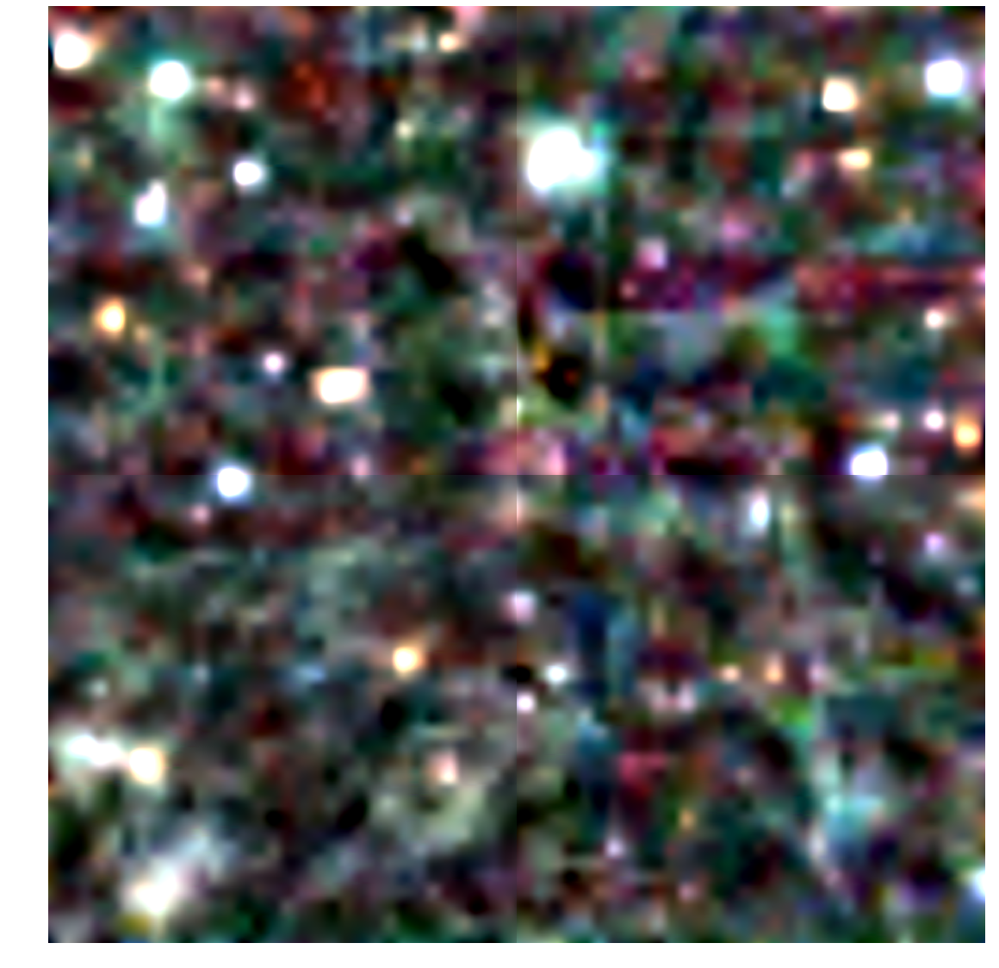

In [90]:
plt.rcParams.update({'figure.figsize' : (19.5, 20)})
fig=plt.figure()
fig.subplots_adjust(wspace=0, hspace=0)

ax1 = plt.subplot(221)
ax1.axis('off')
im1 = ax1.imshow(bg_img_gri24, origin='lower')
ax2 = plt.subplot(222, sharey=ax1)
ax2.axis('off')
im2 = ax2.imshow(bg_img_gri34, origin='lower')
ax3 = plt.subplot(223, sharex=ax1)
ax3.axis('off')
im3 = ax3.imshow(bg_img_gri23, origin='lower')
ax4 = plt.subplot(224, sharex=ax2, sharey=ax3)
ax4.axis('off')
im4 = ax4.imshow(bg_img_gri33, origin='lower')

plt.savefig('bg_patches23_24_33_34.png')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


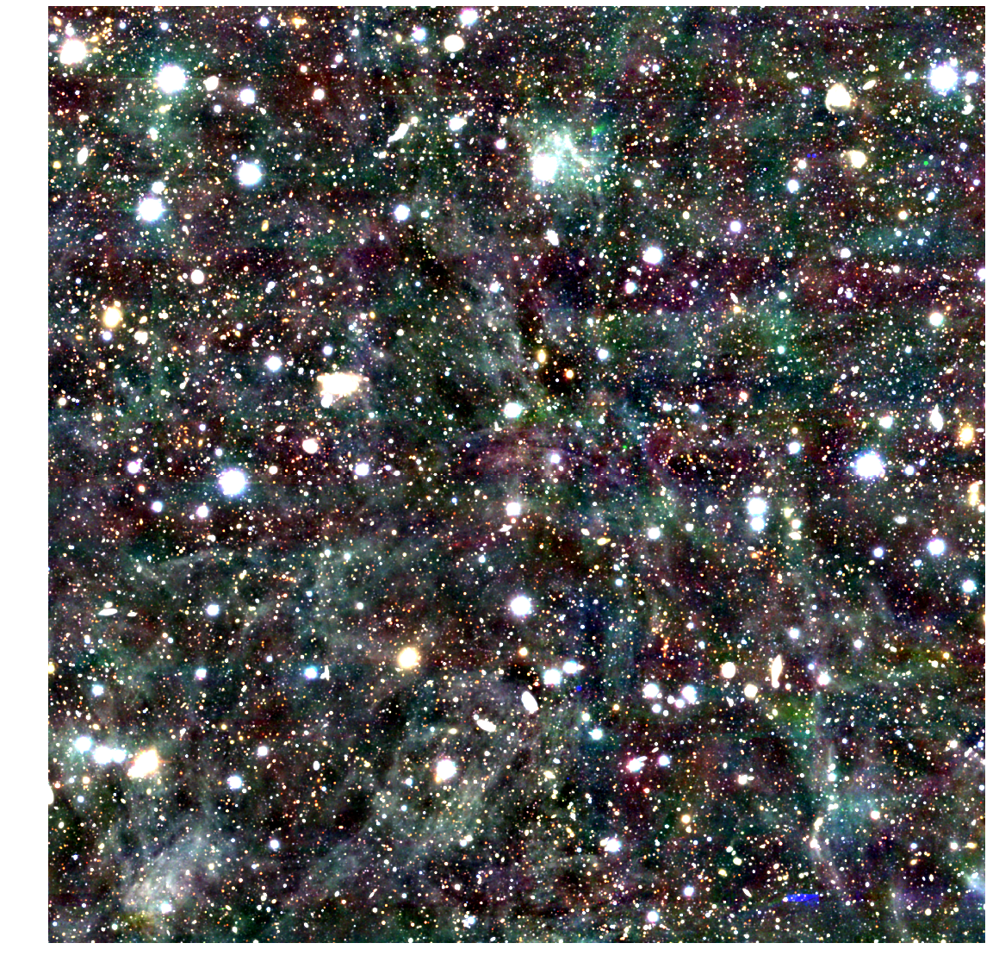

In [124]:
plt.rcParams.update({'figure.figsize' : (19.5, 20)})
fig=plt.figure()
fig.subplots_adjust(wspace=0, hspace=0)

ax1 = plt.subplot(221)
ax1.axis('off')
im1 = ax1.imshow(img_gri24, origin='lower')
ax2 = plt.subplot(222, sharey=ax1)
ax2.axis('off')
im2 = ax2.imshow(img_gri34, origin='lower')
ax3 = plt.subplot(223, sharex=ax1)
ax3.axis('off')
im3 = ax3.imshow(img_gri23, origin='lower')
ax4 = plt.subplot(224, sharex=ax2, sharey=ax3)
ax4.axis('off')
im4 = ax4.imshow(img_gri33, origin='lower')

plt.savefig('coadd_patches23_24_33_34.png')
plt.show()

/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/ipykernel/__main__.py:10: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/ipykernel/__main__.py:13: RuntimeWarning: Images with dimensions (M, N, 3) are interpreted as 2D+RGB by default. Use `multichannel=False` to interpret as 3D image with last dimension of length 3.
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/ipykernel/__main__.py:16: RuntimeWarning: Images with dimensions (M, N, 3) a

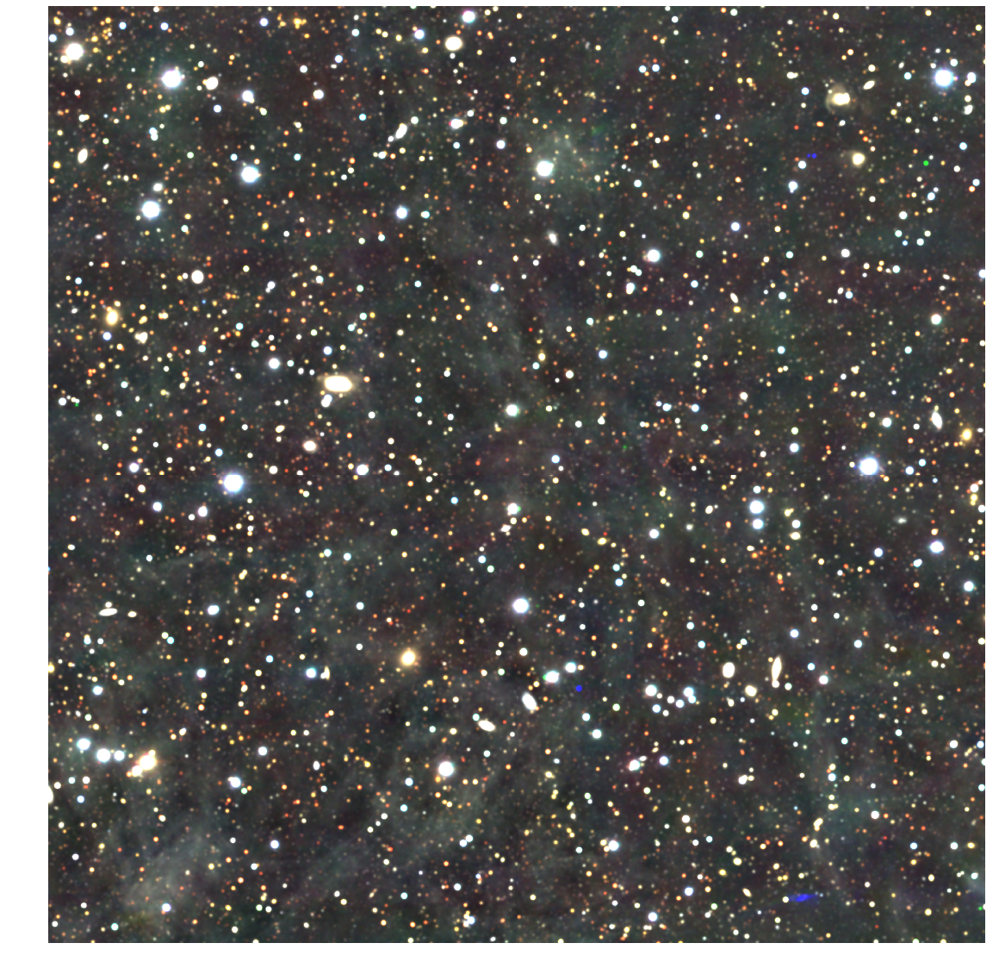

In [101]:
plt.rcParams.update({'figure.figsize' : (19.5, 20)})
fig=plt.figure()
fig.subplots_adjust(wspace=0, hspace=0)

ax1 = plt.subplot(221)
ax1.axis('off')
im1 = ax1.imshow(gaussian(img_gri24, sigma=5), origin='lower')
ax2 = plt.subplot(222, sharey=ax1)
ax2.axis('off')
im2 = ax2.imshow(gaussian(img_gri34, sigma=5), origin='lower')
ax3 = plt.subplot(223, sharex=ax1)
ax3.axis('off')
im3 = ax3.imshow(gaussian(img_gri23, sigma=5), origin='lower')
ax4 = plt.subplot(224, sharex=ax2, sharey=ax3)
ax4.axis('off')
im4 = ax4.imshow(gaussian(img_gri33, sigma=5), origin='lower')

#plt.savefig('coadd_patches23_24_33_34.png')
plt.show()

In [ ]:
bg_img_g = butler.get('deepCoadd_calexp_background', dataId = dataref_g).getImage().array
#img_g = butler.get('deepCoadd_calexp', dataId = dataref_g).getImage().array
img_g = butler.get('deepCoadd', dataId = dataref_g).getImage().array
dataref_r = {'tract':int(df_r.tract.values[0]), 'patch':df_r.patch.values[0], 'filter':df_r.filt.values[0]}
bg_img_r = butler.get('deepCoadd_calexp_background', dataId = dataref_r).getImage().array
img_r = butler.get('deepCoadd', dataId = dataref_r).getImage().array
#img_r = butler.get('deepCoadd_calexp', dataId = dataref_r).getImage().array
dataref_i = {'tract':int(df_i.tract.values[0]), 'patch':df_i.patch.values[0], 'filter':df_i.filt.values[0]}
bg_img_i = butler.get('deepCoadd_calexp_background', dataId = dataref_i).getImage().array
img_i = butler.get('deepCoadd', dataId = dataref_i).getImage().array
calexp_i = butler.get('deepCoadd', dataId = dataref_i)

In [79]:
tmpSkyMap =  butler.get("deepCoadd_skyMap", dataId=dataref_g)
expWcs =  butler.get("deepCoadd_calexp", dataId=dataref_g).getWcs()
tractInfo = tmpSkyMap.findTract(raDec)
skyCorners = [expWcs.pixelToSky(pixPos) for pixPos in bbox.getCorners()]
patchList = tractInfo.findPatchList(skyCorners)

#inb = tmpSkyMap.patchInfo.getInnerBbox()
#outb = tmpSkyMap.patchInfo.getOuterBbox()

In [129]:
skyCorners

[SpherePoint(337.5023828451287*geom.degrees, 1.0191444294344765*geom.degrees),
 SpherePoint(337.3063626147042*geom.degrees, 1.0191217108287371*geom.degrees),
 SpherePoint(337.3063416773078*geom.degrees, 1.2151065650421065*geom.degrees),
 SpherePoint(337.5023706133959*geom.degrees, 1.2151336526055534*geom.degrees)]

/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/ipykernel/__main__.py:7: RuntimeWarning: invalid value encountered in log10
/opt/lsst/software/stack/python/miniconda3-4.7.10/envs/lsst-scipipe-4d7b902/lib/python3.7/site-packages/ipykernel/__main__.py:9: RuntimeWarning: invalid value encountered in log10


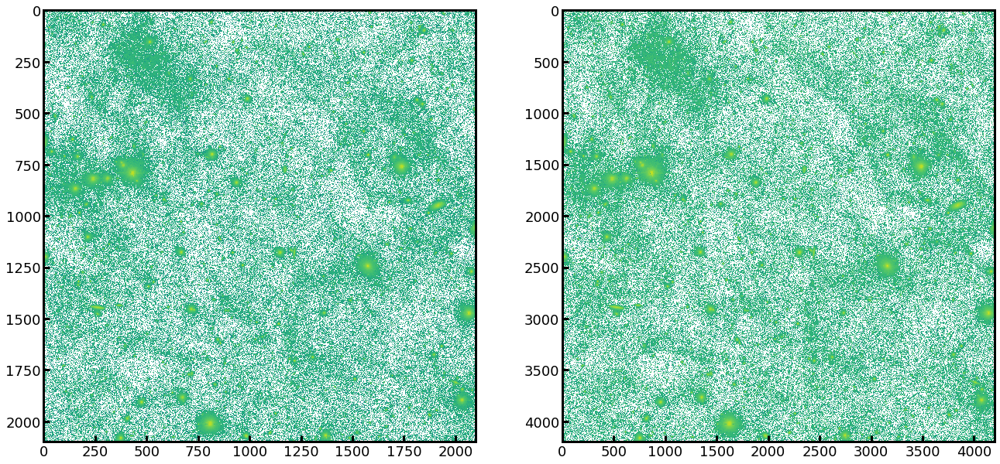

In [128]:
iii = img_i[100:-100, 100:-100]

f, ax = plt.subplots(1, 2)
axs = ax.flatten()

#axs[0] = plt.subplots(121)
im1 = axs[0].imshow(np.log10(bb))
#axs[1] = plt.subplots(122)
im2 = axs[1].imshow(np.log10(img_i))
plt.show()

In [100]:
print(patchList[0].getInnerBBox(), patchList[0].getOuterBBox())

(minimum=(20000, 20000), maximum=(23999, 23999)) (minimum=(19900, 19900), maximum=(24099, 24099))


In [106]:
expWcs.getPixelScale().asArcseconds()

0.16800000008228447

In [107]:
def rebin( a, newshape ):
        '''Rebin an array to a new shape.
        '''
        assert len(a.shape) == len(newshape)

        slices = [ slice(0,old, float(old)/new) for old,new in zip(a.shape,newshape) ]
        coordinates = mgrid[slices]
        indices = coordinates.astype('i')   #choose the biggest smaller integer index
        return a[tuple(indices)]

In [127]:
bb = rebin(img_i, (2100,2100))

In [58]:
def arcmin2pix(narcmin):
    arcsecPerPix = 0.168  # HSC pixels are 0.168"/pixel
    arcminPerPix = arcsecPerPix / 60.0
    npix = narcmin/arcminPerPix
    return int(np.rint(npix))    

In [62]:
def cutoutImage(raDec, size_arcmin, filter):
    '''
    Function to extract an image cutout.
    Inputs:
      raDec: an afwGeom.SpherePoint object with desired RA, Dec center 
      size_arcmin: desired image size (in arcminutes)
      filter: desired filter of extracted image (string)
    '''
# Start with a center position and make a bbox centered there, and expand it to include data from neighboring patches:
    skyMap =  butler.get("deepCoadd_skyMap", immediate=True, tract=tract, patch=patch, filter=filter)
    tmp_calexp = butler.get("deepCoadd_calexp", immediate=True, tract=tract, patch=patch, filter=filter)
    expWcs = tmp_calexp.getWcs()

    size_pixels = arcmin2pix(size_arcmin)
    cutoutSize = geom.ExtentI(size_pixels, size_pixels) # size of cutout in pixels
#    cutoutSize = afwGeom.ExtentI(size_pixels, size_pixels) # size of cutout in pixels
    xy = geom.Point2I(expWcs.skyToPixel(raDec)) # central XY coordinate of our star's RA, Dec position

#    print('xy: ',xy,' cutoutSize: ',cutoutSize)

# Create the bounding box:
    bbox = geom.Box2I(xy - cutoutSize//2, cutoutSize)
    bbox = geom.Box2D(bbox)

    tractInfo = skyMap.findTract(raDec)
    skyCorners = [expWcs.pixelToSky(pixPos) for pixPos in bbox.getCorners()]
    patchList = tractInfo.findPatchList(skyCorners)

# compute coadd bbox
    coaddWcs = tractInfo.getWcs()
    coaddBBox = geom.Box2D()
    for skyPos in skyCorners:
        coaddBBox.include(coaddWcs.skyToPixel(skyPos))
    coaddBBox = geom.Box2I(coaddBBox)

# assemble coadd exposure from subregions of patches
    coaddExposure = afwImage.ExposureF(coaddBBox, coaddWcs)
    coaddExposure.maskedImage.set(np.nan, afwImage.Mask.getPlaneBitMask("NO_DATA"), np.nan)
    nPatchesFound = 0
    coaddFilter = None
    for patchInfo in patchList:
        patchSubBBox = patchInfo.getOuterBBox()
        patchSubBBox.clip(coaddBBox)
        patchArgDict = dict(
                            datasetType="deepCoadd_calexp_sub",
                            bbox=patchSubBBox,
                            tract=tractInfo.getId(),
                            patch="%s,%s" % (patchInfo.getIndex()[0], patchInfo.getIndex()[1]),
                            filter = filter,
                            )
        print("Reading patch %s" % patchArgDict)
        coaddPatch = butler.get(**patchArgDict)
        nPatchesFound += 1
        coaddExposure.maskedImage.assign(coaddPatch.maskedImage, coaddPatch.getBBox())
        if coaddFilter is None:
            coaddFilter = coaddPatch.getFilter()

    if nPatchesFound == 0:
        raise RuntimeError("No patches found!")

    coaddExposure.setFilter(coaddFilter)
    return pipeBase.Struct(exposure=coaddExposure, sources=None)


In [63]:
raDec = geom.SpherePoint(337.78, 0.745, geom.degrees)
cutout_g = cutoutImage(raDec, 2.0, 'HSC-G')

Reading patch {'datasetType': 'deepCoadd_calexp_sub', 'bbox': Box2I(minimum=Point2I(17594, 17668), dimensions=Extent2I(715, 714)), 'tract': 9697, 'patch': '4,4', 'filter': 'HSC-G'}


In [24]:
calexp_g.getWcs()

FITS standard SkyWcs:
Sky Origin: (337.777778, +0.743802)
Pixel Origin: (17999, 17999)
Pixel Scale: 0.168 arcsec/pixel

In [56]:
tract_all=df_tract_patch_visit['tract']
patch_all=df_tract_patch_visit['patch']
tract = tract_all.values[0]
patch = patch_all.values[0]

In [21]:
raDec = geom.SpherePoint(337.78, 0.745, geom.degrees)
cutout_g = cutoutImage(raDec, 20.0, 'HSC-G')
cutout_r = cutoutImage(raDec, 20.0, 'HSC-R')
cutout_i = cutoutImage(raDec, 20.0, 'HSC-I')

Reading patch {'datasetType': 'deepCoadd_calexp_sub', 'bbox': Box2I(minimum=Point2I(14379, 14453), dimensions=Extent2I(1721, 1647)), 'tract': 9697, 'patch': '3,3', 'filter': 'HSC-G'}
Reading patch {'datasetType': 'deepCoadd_calexp_sub', 'bbox': Box2I(minimum=Point2I(14379, 15900), dimensions=Extent2I(1721, 4200)), 'tract': 9697, 'patch': '3,4', 'filter': 'HSC-G'}
Reading patch {'datasetType': 'deepCoadd_calexp_sub', 'bbox': Box2I(minimum=Point2I(14379, 19900), dimensions=Extent2I(1721, 1698)), 'tract': 9697, 'patch': '3,5', 'filter': 'HSC-G'}
Reading patch {'datasetType': 'deepCoadd_calexp_sub', 'bbox': Box2I(minimum=Point2I(15900, 14453), dimensions=Extent2I(4200, 1647)), 'tract': 9697, 'patch': '4,3', 'filter': 'HSC-G'}
Reading patch {'datasetType': 'deepCoadd_calexp_sub', 'bbox': Box2I(minimum=Point2I(15900, 15900), dimensions=Extent2I(4200, 4200)), 'tract': 9697, 'patch': '4,4', 'filter': 'HSC-G'}
Reading patch {'datasetType': 'deepCoadd_calexp_sub', 'bbox': Box2I(minimum=Point2I(1

AttributeError: 'BackgroundList' object has no attribute 'getWcs'

In [30]:
np.size(cutout_g.exposure.getImage().array)

51051025

In [31]:
np.size(img_g)

17640000

In [14]:
# RGB image of the deepCoadd calexp:
img_gri_big = np.zeros((cutout_i.exposure.getImage().array.shape[0], cutout_i.exposure.getImage().array.shape[1], 3), dtype=float)
iscale_big = img_scale.range_from_zscale(cutout_i.exposure.getImage().array)
gscale_big = img_scale.range_from_zscale(cutout_g.exposure.getImage().array)
rscale_big = img_scale.range_from_zscale(cutout_r.exposure.getImage().array)

/home/jcarlin/DM_sprint_Feb2020/img_scale.py:149: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:167: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  slope, intercept = numpy.linalg.lstsq(temp, y)[0]
/home/jcarlin/DM_sprint_Feb2020/img_scale.py:190: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and sile

In [ ]:
# RGB image of the deepCoadd calexp:
bg_img_gri_big = np.zeros((cutout_bg_i.exposure.getImage().array.shape[0], cutout_bg_i.exposure.getImage().array.shape[1], 3), dtype=float)
iscale_bg_big = img_scale.range_from_zscale(cutout_bg_i.exposure.getImage().array)
gscale_bg_big = img_scale.range_from_zscale(cutout_bg_g.exposure.getImage().array)
rscale_bg_big = img_scale.range_from_zscale(cutout_bg_r.exposure.getImage().array)

In [15]:
img_gri_big[:,:,0] = img_scale.linear(cutout_i.exposure.getImage().array, scale_min=iscale_big[0], scale_max=3.0*iscale_big[1])
img_gri_big[:,:,1] = img_scale.linear(cutout_r.exposure.getImage().array, scale_min=rscale_big[0], scale_max=3.0*rscale_big[1])
img_gri_big[:,:,2] = img_scale.linear(cutout_g.exposure.getImage().array, scale_min=gscale_big[0], scale_max=3.0*gscale_big[1])
bg_img_gri_big[:,:,0] = img_scale.linear(cutout_bg_i.exposure.getImage().array, scale_min=iscale_bg_big[0], scale_max=3.0*iscale_bg_big[1])
bg_img_gri_big[:,:,1] = img_scale.linear(cutout_bg_r.exposure.getImage().array, scale_min=rscale_bg_big[0], scale_max=3.0*rscale_bg_big[1])
bg_img_gri_big[:,:,2] = img_scale.linear(cutout_bg_g.exposure.getImage().array, scale_min=gscale_bg_big[0], scale_max=3.0*gscale_bg_big[1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


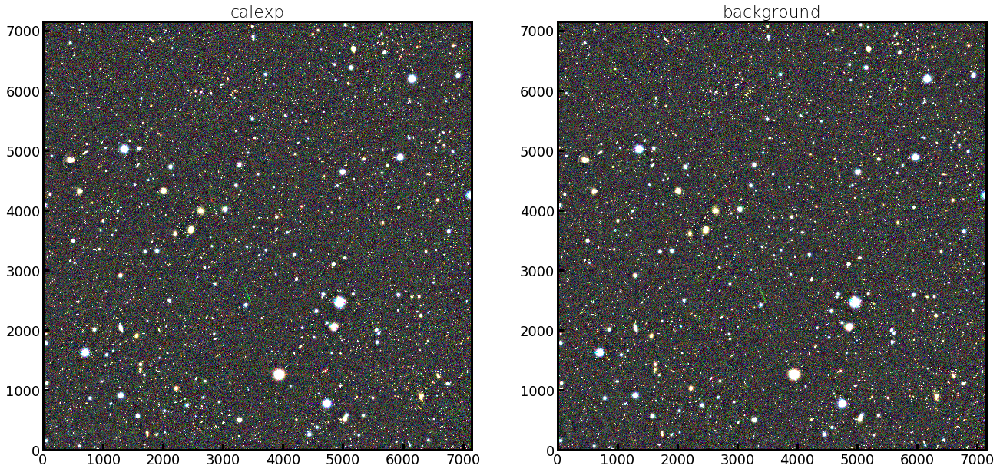

In [17]:
norm_gri_big = ImageNormalize(img_gri_big, interval=ZScaleInterval(),
                          stretch=LinearStretch())
#norm_bg_gri_big = ImageNormalize(bg_img_gri, interval=ZScaleInterval(),
#                             stretch=LinearStretch())

plt.rcParams.update({'figure.figsize' : (22, 12)})
plt.rcParams.update({'font.size' : 18})

f, ax = plt.subplots(1, 2)
axs = ax.flatten()

im0 = axs[0].imshow(img_gri_big, norm=norm_gri_big, origin='lower')
axs[0].set_title('calexp')
im1 = axs[1].imshow(img_gri_big, norm=norm_gri_big, origin='lower')
#im1 = axs[1].imshow(bg_img_gri, norm=norm_bg_gri, origin='lower')
axs[1].set_title('background')
plt.show()

In [35]:
from astropy.visualization import make_lupton_rgb

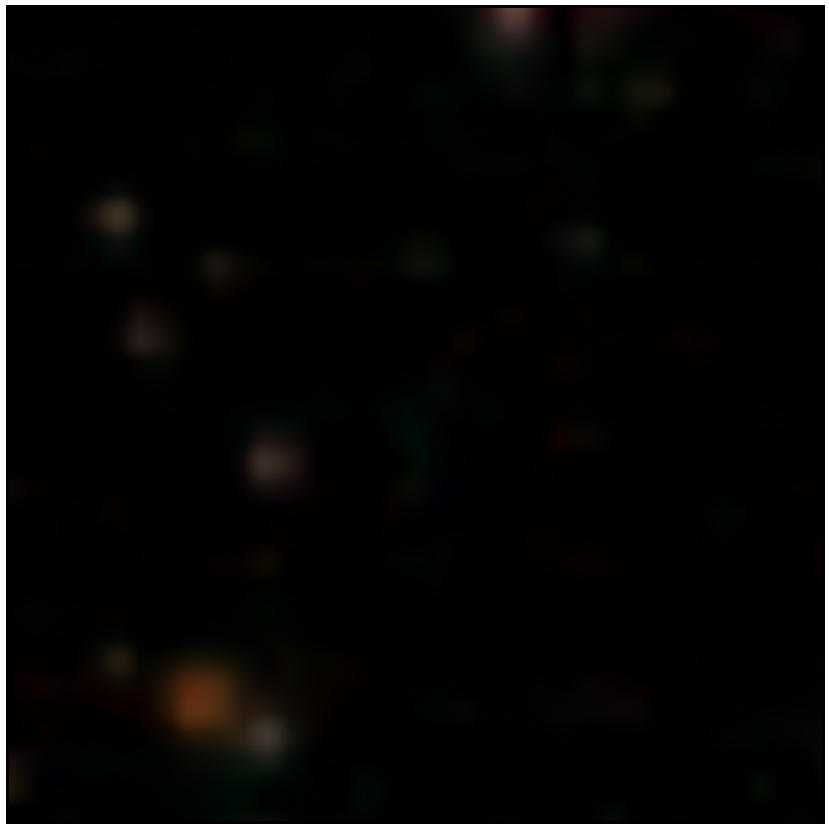

In [53]:
#imgI2 = images['HSC-I2'].image.array
#imgG = images['HSC-G'].image.array
rgb = make_lupton_rgb(image_r=bg_img_i,  # numpy array for the r channel
                      image_g=bg_img_r,  # numpy array for the g channel
                      image_b=bg_img_g,  # numpy array for the b channel
#                      minimum = 0.0,  # 0.01,
#                      stretch=0.5, Q=0)  # parameters used to stretch and scale the pixel values; Q=0 results in linear stretch
                      stretch=0.5, Q=10)  # parameters used to stretch and scale the pixel values (I liked stretch=0.5, Q=7 originally)
plt.figure(figsize=(20, 15))
# Exposure.getBBox() returns a Box2I, a box with integer pixel coordinates that correspond to the centers of pixels.
# Matplotlib's `extent` argument expects to receive the coordinates of the edges of pixels, which is what
# this Box2D (a box with floating-point coordinates) represents.
integerPixelBBox = calexp_i.getBBox()
bbox = geom.Box2D(integerPixelBBox)
plt.imshow(rgb, interpolation='nearest', origin='lower', extent=(bbox.getMinX(), bbox.getMaxX(), bbox.getMinY(), bbox.getMaxY()))
plt.xticks([])
plt.yticks([])

plt.show()
#pyplot.savefig('DDO44_RGB_fullpatch.png')

##### Not what I want, because asinh scaling doesn't show background details well...

In [97]:
repo_paths = ['/datasets/hsc/repo/rerun/RC/w_2020_03/DM-23121',\
              '/project/jcarlin/background_experiment/bg256',\
              '/project/jcarlin/background_experiment/bg512',\
              '/project/jcarlin/background_experiment/bg64',\
              '/project/jcarlin/background_experiment/bg128_cheb']

In [99]:
for repo in repo_paths:
    parts = repo.split('/')
    print(parts[-1])

DM-23121
bg256
bg512
bg64
bg128_cheb


In [100]:
repo.split('/')[-1]

'bg128_cheb'